In [1]:
import pandas as pd
from pandas_profiling import ProfileReport

/var/folders/7f/cpp49npn0wv7ddgbq3vdwcbc0000gn/T/ipykernel_69026/3034448462.py:2: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


In [2]:
cab=pd.read_csv('Cab_Data.csv')
city=pd.read_csv('City.csv')
customer=pd.read_csv('Customer_ID.csv')
trans=pd.read_csv('Transaction_ID.csv')

In [5]:
cab_pro=ProfileReport(cab,title='Cab Data')
cab_pro

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
city_pro=ProfileReport(city,title='City')
city_pro

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
cus_pro=ProfileReport(customer,title='Customer Data')
cus_pro

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [10]:
trans_pro=ProfileReport(trans,title='Transaction Data')
trans_pro

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Merge the four DataFrames to get the master data 

* From the pandas profiling report above, we can see that there is a many-to-one relationship between Cab_Data and Customer_ID, while the two features Transaction_ID and Customer_ID in the dataframe Transaction_ID serve as reference keys. 


* Moreover, Cab_Data and City has a many-to-one relationship where the feature city serves as the reference key. Nevertheless, merging Cab_Data and City into the master Dataframe will create a lot of problems here. If we do so, Population and Users will become two numerical variables with very few distinct values. For the sake of simplicity, the City Dataframe will be excluded from the master Dataframe and kept for future analysis. 


* The expected result will be a master dataframe where Transaction ID is the primary key that uniquely identifies a transaction record.



In [15]:
master=trans.merge(customer,on='Customer ID').merge(cab,on='Transaction ID')
master.head()

,Transaction ID,Customer ID,Payment_Mode,Gender,Age,Income (USD/Month),Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip
0,10000011,29290,Card,Male,28,10813,42377,Pink Cab,ATLANTA GA,30.45,370.95,313.6350
1,10351127,29290,Cash,Male,28,10813,43302,Yellow Cab,ATLANTA GA,26.19,598.70,317.4228
2,10412921,29290,Card,Male,28,10813,43427,Yellow Cab,ATLANTA GA,42.55,792.05,597.4020
3,10000012,27703,Card,Male,27,9237,42375,Pink Cab,ATLANTA GA,28.62,358.52,334.8540
4,10320494,27703,Card,Male,27,9237,43211,Yellow Cab,ATLANTA GA,36.38,721.10,467.1192


In [16]:
master_pro=ProfileReport(master,title='Master')
master_pro

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Duplicates and Missing values


* It's worth noticing that while there are 20 observations in the dataframe City, there are only 19 distinct cities in the dataframe Cab_Data. There isn't any transaction record from SAN FRANCISCO CA. Therefore, we consider this part of data as missing. However, the missing transaction records from San Francisco wouldn't have a big impact on our further analysis, so we can simply ignore the missing data.


* It's also worth noticing that there are 359392 unique Transaction IDs in the dataframe Cab_Data, but the Transaction_Id dataframe has 440098 unique Transaction IDs. The difference between the value counts are probably the missing values which we mentioned above. Nevertheless, since these missing data won't significantly affect the further analysis, we can ignore them again and merge the rest of the data into the master dataframe.



* As the reports shows, there is no duplicate row in any of the dataframes.

### Descriptive Analysis for Numerical Attributes

* Note that certain features such as Transcation Id and Customer Id have numerical values but are only counted as reference keys. These features will not be taken into considerations in this part of analysis. (Time variables will also be taken out of consideration in this part)


* The remaining features for this part of analysis are: Age, Income (USD/Month), KM Travelled, Price Charged, and Cost of Trip.


* From the report above, we can find that for these features there isn't any abnormal values which can potentially indicate the existence of missing values. (For example, if age or KM Travelled have a minimum value of 0, these counts of 0 can be actually missing values.)

### Descriptive Analysis for Categorical Attributes

* In this part of analysis, we mainly consider the following features: Payment Mode, Gender, Company, City.

* Again, as the report shows, there isn't any abnormality worth noticing. Therefore, we can move on to the next step of analysis.

### Correlation Analysis

* The profiling report shows several alerts based on the correlation analysis:


    * Transaction ID is highly overall correlated with Date of Travel
    
    * Customer ID is highly overall correlated with City.
    
    * The up 2 alerts can be ignored since Customer ID and Transaction ID mainly serve as the reference keys and will not be taken into further analysis anyway.
    
    * KM Travelled is highly overall correlated with Price Charged. This is reasonable because Price Charged should be propotional to the KM Travelled.
    
    * Cost of Trip is highly overall correlated with KM Travelled. This is reasonable because Cost of Trip should also be propotional to the KM Travelled.

## Hypothesis and Investigations:

In [144]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency
import seaborn as sns 

### 1 hypothesis: The total KM Travelled propotionally increase with increase in income of a customer.

In [30]:
total_km=master.groupby(['Customer ID']).sum()['KM Travelled']
inc_km=customer.merge(total_km,on='Customer ID').rename(columns={'KM Travelled':'TotalKM'})
inc_km.head()

,Customer ID,Gender,Age,Income (USD/Month),TotalKM
0,29290,Male,28,10813,99.19
1,27703,Male,27,9237,84.57
2,28712,Male,53,11242,86.21
3,28020,Male,23,23327,133.33
4,27182,Male,33,8536,80.19


In [32]:
np.corrcoef(inc_km['Income (USD/Month)'],inc_km['TotalKM'])

array([[1.        , 0.00507315],
       [0.00507315, 1.        ]])

As the Pearson Correlation Coefficient shows, the linear association between customer's income level and the total KM travelled is very weak. Thus we cannot reject the null hypothesis.

### 2 hypothesis: Pink Cab has a higher Gross Profit Margin than Yellow Cab.

In [47]:
gpm=master.groupby(by="Company").sum()[['Price Charged', 'Cost of Trip']]
gpm["Gross Profit Margin"]=(gpm['Price Charged']-gpm['Cost of Trip'])/gpm['Cost of Trip']
gpm

,Price Charged,Cost of Trip,Gross Profit Margin
Company,,,
Pink Cab,2.632825e+07,2.102092e+07,0.252478
Yellow Cab,1.258539e+08,8.183351e+07,0.537926


As the dataframe above shows, Yellow Cab has both a higher revenue and a higher Gross Profit Margin.

### 3 hypothesis: the distribution of customers with different companies and the distribution of customers in different cities are interdependent.

In [75]:
pink_city=master.loc[master['Company']=='Pink Cab']['City'].value_counts()
yellow_city=master.loc[master['Company']=='Yellow Cab']['City'].value_counts()
com_city = pd.concat([yellow_city, pink_city], axis=1)
com_city.columns=['yellow','pink']
com_city

,yellow,pink
NEW YORK NY,85918,13967
CHICAGO IL,47264,9361
WASHINGTON DC,40045,3692
LOS ANGELES CA,28168,19865
BOSTON MA,24506,5186
SAN DIEGO CA,9816,10672
ATLANTA GA,5795,1762
DALLAS TX,5637,1380
SEATTLE WA,5265,2732
SILICON VALLEY,4722,3797


In [91]:
stat, p, dof, expected = chi2_contingency(observed=[com_city['yellow'].tolist(),com_city['pink'].tolist()])

alpha = 0.05
print("p value is ", p)
if p <= alpha:
    print('Dependent (reject H0)')
else:
    print('Independent (H0 holds true)')

p value is  0.0
Dependent (reject H0)


By the chi-squared test above, we can see that the relationship between two features City and Company is significant.

### 4 hypothesis: the payment mode chosen by the customers depends on the cab company they used.

In [95]:
pink_mode=master.loc[master['Company']=='Pink Cab']['Payment_Mode'].value_counts()
yellow_mode=master.loc[master['Company']=='Yellow Cab']['Payment_Mode'].value_counts()
com_pay = pd.concat([yellow_mode, pink_mode], axis=1)
com_pay.columns=['yellow','pink']
com_pay

,yellow,pink
Card,164785,50719
Cash,109896,33992


In [96]:
stat, p, dof, expected = chi2_contingency(com_pay)

alpha = 0.05
print("p value is ", p)
if p <= alpha:
    print('Dependent (reject H0)')
else:
    print('Independent (H0 holds true)')

p value is  0.5411981778304723
Independent (H0 holds true)


Therefore, by the chi-squared test, we accept H0, which shows that our variables do not have a significant relation.

### 5 hypothesis: There's seasonality in the cab industry.

In [151]:
from datetime import datetime

In [154]:
master['Date of Travel']=master['Date of Travel'].map(datetime.fromordinal)

In [156]:
master.head()

,Transaction ID,Customer ID,Payment_Mode,Gender,Age,Income (USD/Month),Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip
0,10000011,29290,Card,Male,28,10813,0117-01-09 00:00:00,Pink Cab,ATLANTA GA,30.45,370.95,313.6350
1,10351127,29290,Cash,Male,28,10813,0119-07-23 00:00:00,Yellow Cab,ATLANTA GA,26.19,598.70,317.4228
2,10412921,29290,Card,Male,28,10813,0119-11-25 00:00:00,Yellow Cab,ATLANTA GA,42.55,792.05,597.4020
3,10000012,27703,Card,Male,27,9237,0117-01-07 00:00:00,Pink Cab,ATLANTA GA,28.62,358.52,334.8540
4,10320494,27703,Card,Male,27,9237,0119-04-23 00:00:00,Yellow Cab,ATLANTA GA,36.38,721.10,467.1192


In [157]:
from statsmodels.tsa.arima.model import ARIMA

In [158]:
master_d= master.set_index('Date of Travel')

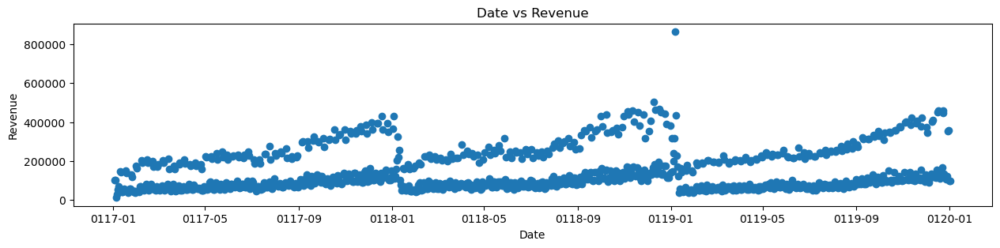

In [173]:
#plot date against daily revenue
plt.figure(figsize=(15,3))
plt.scatter(master_d.groupby('Date of Travel')['Price Charged'].sum().index, master_d.groupby('Date of Travel')['Price Charged'].sum())
plt.xlabel('Date')
plt.ylabel('Revenue')
plt.title('Date vs Revenue')
plt.show()

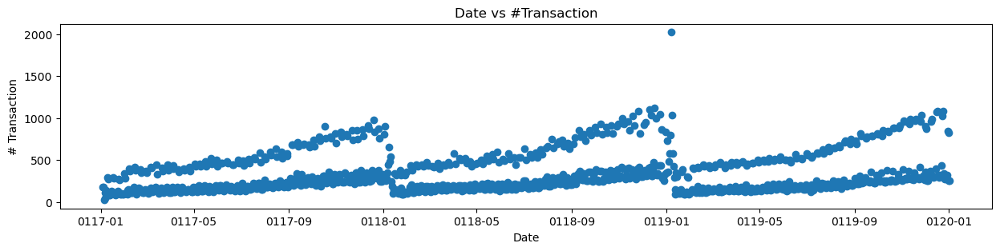

In [172]:
#plot date against daily number of transaction
plt.figure(figsize=(15,3))
plt.scatter(master_d.groupby('Date of Travel')['Transaction ID'].count().index, master_d.groupby('Date of Travel')['Transaction ID'].count())
plt.xlabel('Date')
plt.ylabel('# Transaction')
plt.title('Date vs #Transaction')
plt.show()

In [174]:
master_dp=master_d[master_d['Company']=='Pink Cab']
master_dy=master_d[master_d['Company']=='Yellow Cab']

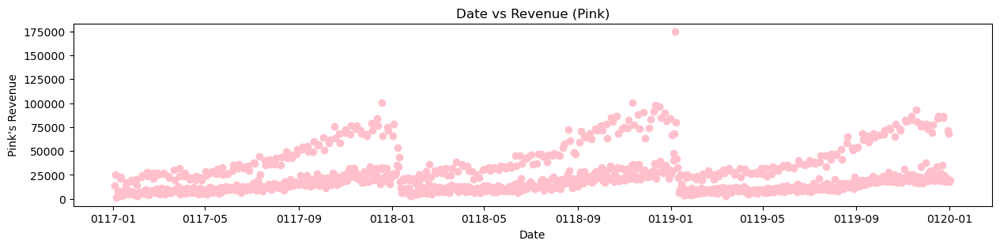

In [175]:
plt.figure(figsize=(15,3))
plt.scatter(master_dp.groupby('Date of Travel')['Price Charged'].sum().index, master_dp.groupby('Date of Travel')['Price Charged'].sum(), color='pink')
plt.xlabel('Date')
plt.ylabel("Pink's Revenue")
plt.title('Date vs Revenue (Pink)')
plt.show()

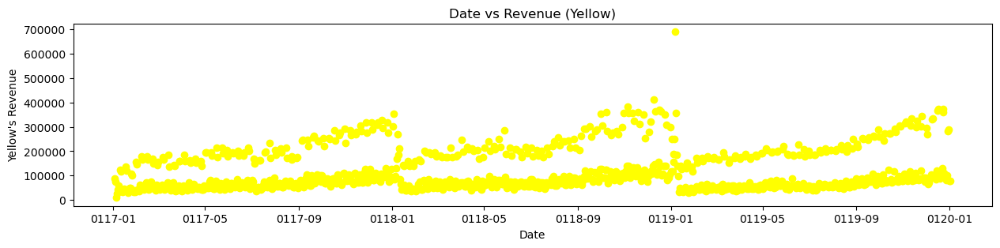

In [176]:
plt.figure(figsize=(15,3))
plt.scatter(master_dy.groupby('Date of Travel')['Price Charged'].sum().index, master_dy.groupby('Date of Travel')['Price Charged'].sum(),color='yellow')
plt.xlabel('Date')
plt.ylabel("Yellow's Revenue")
plt.title('Date vs Revenue (Yellow)')
plt.show()